In [1]:
import numpy as np
import pandas as pd
import torch
import torch.optim as optim
from torch import nn as nn
import matplotlib.pyplot as plt
import functools as Fntl
from functools import reduce
from torch.utils.data import DataLoader
from torch.utils.data import Dataset

In [2]:
df1 = pd.read_csv("data/from_book/hour.csv")

In [3]:
df1

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0000,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0000,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0000,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0000,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0000,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17374,17375,2012-12-31,1,1,12,19,0,1,1,2,0.26,0.2576,0.60,0.1642,11,108,119
17375,17376,2012-12-31,1,1,12,20,0,1,1,2,0.26,0.2576,0.60,0.1642,8,81,89
17376,17377,2012-12-31,1,1,12,21,0,1,1,1,0.26,0.2576,0.60,0.1642,7,83,90
17377,17378,2012-12-31,1,1,12,22,0,1,1,1,0.26,0.2727,0.56,0.1343,13,48,61


In [4]:
df1.columns

Index(['instant', 'dteday', 'season', 'yr', 'mnth', 'hr', 'holiday', 'weekday',
       'workingday', 'weathersit', 'temp', 'atemp', 'hum', 'windspeed',
       'casual', 'registered', 'cnt'],
      dtype='object')

#### make 1-hot input features

In [9]:
pd.unique(df1['season'])

array([1, 2, 3, 4])

In [11]:
pd.unique(df1['mnth'])

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])

In [12]:
pd.unique(df1['hr'])

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23])

In [13]:
pd.unique(df1['holiday'])

array([0, 1])

binary, keep as is

In [14]:
pd.unique(df1['weekday'])

array([6, 0, 1, 2, 3, 4, 5])

In [17]:
pd.unique(df1['workingday'])

array([0, 1])

binary, keep as is.

In [16]:
pd.unique(df1['weathersit'])

array([1, 2, 3, 4])

In [19]:
dummy_fields = ['season', 'mnth', 'hr', 'weekday', 'weathersit']

In [31]:
df_inp = Fntl.reduce(lambda acc, x: pd.concat([acc,
                                                pd.get_dummies(df1[x],
                                                               prefix=x,
                                                               drop_first=False)],
                                               axis=1),
                      dummy_fields,
                      pd.DataFrame())

In [32]:
df_inp

,season_1,season_2,season_3,season_4,mnth_1,mnth_2,mnth_3,mnth_4,mnth_5,mnth_6,...,weekday_1,weekday_2,weekday_3,weekday_4,weekday_5,weekday_6,weathersit_1,weathersit_2,weathersit_3,weathersit_4
0,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
1,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
2,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
3,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
4,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17374,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0
17375,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0
17376,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0
17377,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0


In [33]:
df_inp.columns

Index(['season_1', 'season_2', 'season_3', 'season_4', 'mnth_1', 'mnth_2',
       'mnth_3', 'mnth_4', 'mnth_5', 'mnth_6', 'mnth_7', 'mnth_8', 'mnth_9',
       'mnth_10', 'mnth_11', 'mnth_12', 'hr_0', 'hr_1', 'hr_2', 'hr_3', 'hr_4',
       'hr_5', 'hr_6', 'hr_7', 'hr_8', 'hr_9', 'hr_10', 'hr_11', 'hr_12',
       'hr_13', 'hr_14', 'hr_15', 'hr_16', 'hr_17', 'hr_18', 'hr_19', 'hr_20',
       'hr_21', 'hr_22', 'hr_23', 'weekday_0', 'weekday_1', 'weekday_2',
       'weekday_3', 'weekday_4', 'weekday_5', 'weekday_6', 'weathersit_1',
       'weathersit_2', 'weathersit_3', 'weathersit_4'],
      dtype='object')

#### inclue binary features

In [34]:
binary_fields = ['holiday', 'workingday']

In [35]:
df_inp = Fntl.reduce(lambda acc, x: pd.concat([acc, df1[x]],
                                               axis=1),
                      binary_fields,
                      df_inp)

In [36]:
df_inp

,season_1,season_2,season_3,season_4,mnth_1,mnth_2,mnth_3,mnth_4,mnth_5,mnth_6,...,weekday_3,weekday_4,weekday_5,weekday_6,weathersit_1,weathersit_2,weathersit_3,weathersit_4,holiday,workingday
0,1,0,0,0,1,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
1,1,0,0,0,1,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
2,1,0,0,0,1,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
3,1,0,0,0,1,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
4,1,0,0,0,1,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17374,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1
17375,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1
17376,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
17377,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1


In [37]:
df_inp.columns

Index(['season_1', 'season_2', 'season_3', 'season_4', 'mnth_1', 'mnth_2',
       'mnth_3', 'mnth_4', 'mnth_5', 'mnth_6', 'mnth_7', 'mnth_8', 'mnth_9',
       'mnth_10', 'mnth_11', 'mnth_12', 'hr_0', 'hr_1', 'hr_2', 'hr_3', 'hr_4',
       'hr_5', 'hr_6', 'hr_7', 'hr_8', 'hr_9', 'hr_10', 'hr_11', 'hr_12',
       'hr_13', 'hr_14', 'hr_15', 'hr_16', 'hr_17', 'hr_18', 'hr_19', 'hr_20',
       'hr_21', 'hr_22', 'hr_23', 'weekday_0', 'weekday_1', 'weekday_2',
       'weekday_3', 'weekday_4', 'weekday_5', 'weekday_6', 'weathersit_1',
       'weathersit_2', 'weathersit_3', 'weathersit_4', 'holiday',
       'workingday'],
      dtype='object')

#### normalize the quantitative data

In [38]:
qnt_fields = ['temp', 'atemp', 'hum', 'windspeed', 'casual', 'registered', 'cnt']

In [39]:
feature_statistics = {}
df_qnt = pd.DataFrame()
for k in qnt_fields:
    mean, std = (df1[k].mean(), df1[k].std())
    feature_statistics[k] = (mean, std)
    df_qnt[k] = (df1[k] - mean) / std

In [40]:
df_qnt

,temp,atemp,hum,windspeed,casual,registered,cnt
0,-1.334609,-1.093249,0.947345,-1.553844,-0.662736,-0.930162,-0.956312
1,-1.438475,-1.181698,0.895513,-1.553844,-0.561326,-0.804632,-0.823998
2,-1.438475,-1.181698,0.895513,-1.553844,-0.622172,-0.837666,-0.868103
3,-1.334609,-1.093249,0.636351,-1.553844,-0.662736,-0.949983,-0.972851
4,-1.334609,-1.093249,0.636351,-1.553844,-0.723582,-1.009445,-1.039008
...,...,...,...,...,...,...,...
17374,-1.230743,-1.269565,-0.141133,-0.211685,-0.500481,-0.302509,-0.388467
17375,-1.230743,-1.269565,-0.141133,-0.211685,-0.561326,-0.480894,-0.553859
17376,-1.230743,-1.269565,-0.141133,-0.211685,-0.581608,-0.467681,-0.548346
17377,-1.230743,-1.181698,-0.348463,-0.456086,-0.459917,-0.698922,-0.708224


#### add quantitative data into df_inp & df_tgt

In [41]:
qnt_features = ['temp', 'atemp', 'hum', 'windspeed']
qnt_tgts = ['casual', 'registered', 'cnt']

In [42]:
df_inp = pd.concat([df_inp, df_qnt[qnt_features]],
                   axis=1)

In [43]:
df_inp

,season_1,season_2,season_3,season_4,mnth_1,mnth_2,mnth_3,mnth_4,mnth_5,mnth_6,...,weathersit_1,weathersit_2,weathersit_3,weathersit_4,holiday,workingday,temp,atemp,hum,windspeed
0,1,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,-1.334609,-1.093249,0.947345,-1.553844
1,1,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,-1.438475,-1.181698,0.895513,-1.553844
2,1,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,-1.438475,-1.181698,0.895513,-1.553844
3,1,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,-1.334609,-1.093249,0.636351,-1.553844
4,1,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,-1.334609,-1.093249,0.636351,-1.553844
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17374,1,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,1,-1.230743,-1.269565,-0.141133,-0.211685
17375,1,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,1,-1.230743,-1.269565,-0.141133,-0.211685
17376,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,1,-1.230743,-1.269565,-0.141133,-0.211685
17377,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,1,-1.230743,-1.181698,-0.348463,-0.456086


In [44]:
df_inp.columns

Index(['season_1', 'season_2', 'season_3', 'season_4', 'mnth_1', 'mnth_2',
       'mnth_3', 'mnth_4', 'mnth_5', 'mnth_6', 'mnth_7', 'mnth_8', 'mnth_9',
       'mnth_10', 'mnth_11', 'mnth_12', 'hr_0', 'hr_1', 'hr_2', 'hr_3', 'hr_4',
       'hr_5', 'hr_6', 'hr_7', 'hr_8', 'hr_9', 'hr_10', 'hr_11', 'hr_12',
       'hr_13', 'hr_14', 'hr_15', 'hr_16', 'hr_17', 'hr_18', 'hr_19', 'hr_20',
       'hr_21', 'hr_22', 'hr_23', 'weekday_0', 'weekday_1', 'weekday_2',
       'weekday_3', 'weekday_4', 'weekday_5', 'weekday_6', 'weathersit_1',
       'weathersit_2', 'weathersit_3', 'weathersit_4', 'holiday', 'workingday',
       'temp', 'atemp', 'hum', 'windspeed'],
      dtype='object')

In [45]:
df_tgt = df_qnt['cnt']

In [46]:
df_tgt

0       -0.956312
1       -0.823998
2       -0.868103
3       -0.972851
4       -1.039008
           ...   
17374   -0.388467
17375   -0.553859
17376   -0.548346
17377   -0.708224
17378   -0.774381
Name: cnt, Length: 17379, dtype: float64

#### make the train/test inp/tgt tensors

In [47]:
train_x = torch.tensor(df_inp[:-21*24].values).float()
test_x = torch.tensor(df_inp[-21*24:].values).float()

In [48]:
train_x.shape

torch.Size([16875, 57])

In [49]:
test_x.shape

torch.Size([504, 57])

In [51]:
tsr_tgt = torch.tensor(df_tgt.values.reshape(len(df_tgt),1)).float()

In [54]:
train_y = tsr_tgt[:-21*24,:]

In [55]:
test_y = tsr_tgt[-21*24:,:]

In [56]:
train_y.shape

torch.Size([16875, 1])

In [57]:
test_y.shape

torch.Size([504, 1])

### Make DataSet Object

In [58]:
class BSDataset(Dataset):
    def __init__(self, xs, ys):
        self.xs = xs
        self.ys = ys
    def __len__(self):
        return self.xs.shape[0]
    def __getitem__(self, id):
        return self.xs[id], self.ys[id]

In [59]:
train_set = BSDataset(train_x, train_y)

In [60]:
test_set = BSDataset(test_x, test_y)

In [61]:
batch_size = 128

In [62]:
train_dataloader = DataLoader(train_set, batch_size=batch_size)
test_dataloader = DataLoader(test_set, batch_size=batch_size)

### Make model

In [63]:
class BSModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(BSModel, self).__init__()
        self.stack = nn.Sequential(
            nn.Linear(input_size, hidden_size),
            nn.Sigmoid(),
            nn.Linear(hidden_size, output_size)
        )
    def forward(self, inp):
        return self.stack(inp)

In [64]:
inp_size = train_x.shape[1]
hidden_size = 10
output_size = 1

In [65]:
md0 = BSModel(inp_size, hidden_size, output_size)

### Make the train / test functions

In [66]:
optimizer = optim.SGD(md0.parameters(), lr=0.01)

In [67]:
loss_fn = nn.MSELoss()

In [68]:
def train_epoch(dataloader, model, loss_fn, optimizer):
    size = len(dataloader.dataset)
    loss = 0.
    for batch, (X, y) in enumerate(dataloader):
        # Compute prediction and loss
        pred = model(X)
        loss = loss_fn(pred, y)

        # Backpropagation
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        #if batch % 100 == 0:
        #    loss, current = loss.item(), batch * len(X)
        #    print(f"loss: {loss:>7f}  [{current:>8d}/{size:>8d}]")
    return loss

In [98]:
def trn_epoches(tot_epoches, model, loss_fn, dataloader, optimizer):
    losses = []
    for i in range(tot_epoches):
        loss = train_epoch(dataloader, model, loss_fn, optimizer)
        losses.append(loss)
        if i % 200 == 0:
            print(f"epoch {i:>6d}/{tot_epoches:>6d}, loss: {loss:>7f}")
    return losses
        

In [70]:
def test_loop(model, xs, ys, loss_fn):
    with torch.no_grad():
        pred = model(xs)
        test_loss = loss_fn(pred, ys).item()
    print(f"loss: {test_loss:>8f} \n")
    return pred

### Training

In [71]:
loss_hist = trn_epoches(1000, md0,loss_fn, train_dataloader,optimizer)


epoch      0/  1000, loss: 0.848422

epoch    200/  1000, loss: 0.270695

epoch    400/  1000, loss: 0.131978

epoch    600/  1000, loss: 0.097693

epoch    800/  1000, loss: 0.098435


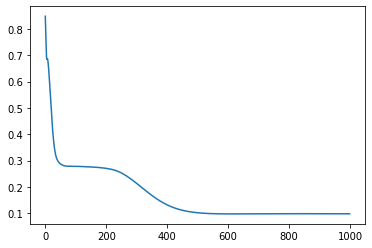

In [72]:
plt.plot(loss_hist)

### check train cycle 1

In [77]:
pred_train = test_loop(md0, train_x, train_y, loss_fn)

loss: 0.234949 



Pred vs test data (normalized)

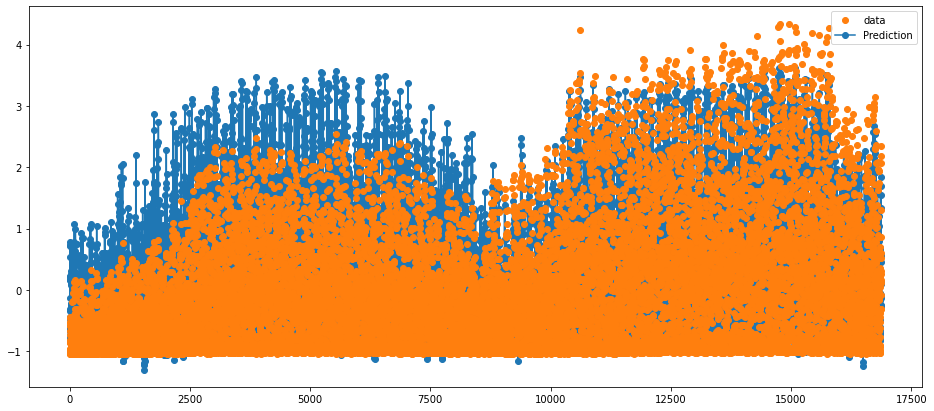

In [78]:
plt.figure(figsize = (16, 7))
#x_data = df_inp_test.reset_index()['index']
pred_data = pred_train.numpy()
tgt_data = train_y.numpy()
pred_plot, = plt.plot(pred_data, 'o-')
cnt_plot, = plt.plot(tgt_data, 'o')
plt.legend([cnt_plot, pred_plot],['data', 'Prediction'])
plt.show()

#### train cycle 2

In [79]:
loss_hist_2 = trn_epoches(1000, md0,loss_fn, train_dataloader,optimizer)


epoch      0/  1000, loss: 0.098126

epoch    200/  1000, loss: 0.097160

epoch    400/  1000, loss: 0.095890

epoch    600/  1000, loss: 0.094509

epoch    800/  1000, loss: 0.093154


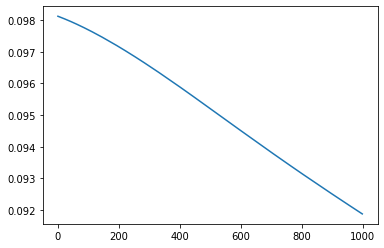

In [80]:
plt.plot(loss_hist_2)

In [81]:
pred_train_2 = test_loop(md0, train_x, train_y, loss_fn)

loss: 0.230061 



In [88]:
tgt_data_train = train_y.numpy() * feature_statistics['cnt'][1] + feature_statistics['cnt'][0]

In [90]:
tgt_data_test = df1['cnt'][-21*24:].values

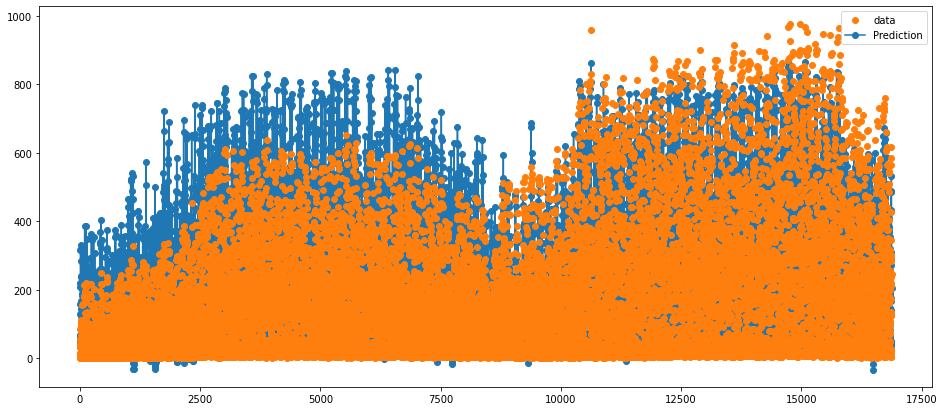

In [361]:
plt.figure(figsize = (16, 7))
#x_data = df_inp_test.reset_index()['index']
pred_data = pred_train_2.numpy() * feature_statistics['cnt'][1] + feature_statistics['cnt'][0]
pred_plot, = plt.plot(pred_data, 'o-')
cnt_plot, = plt.plot(tgt_data_train, 'o')
plt.legend([cnt_plot, pred_plot],['data', 'Prediction'])
plt.show()

In [73]:
pred = test_loop(md0, test_x, test_y, loss_fn)

loss: 0.121414 



In [93]:
pred_data_test2 = pred.numpy() * feature_statistics['cnt'][1] + feature_statistics['cnt'][0]

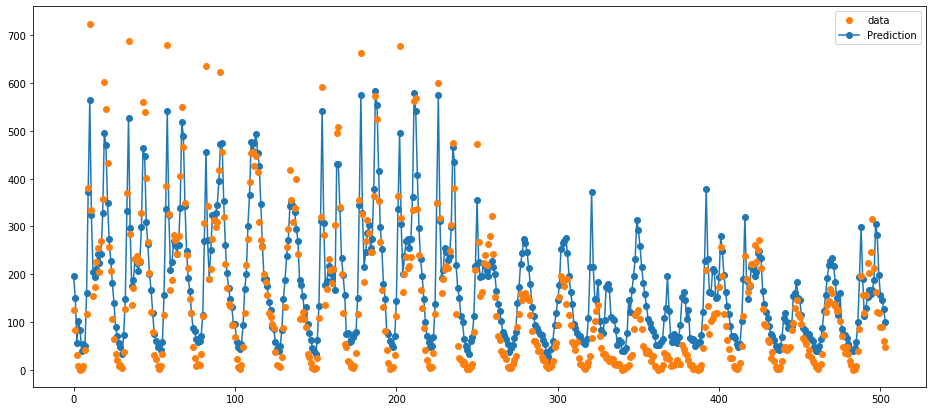

In [94]:
plt.figure(figsize = (16, 7))
#x_data = df_inp_test.reset_index()['index']
pred_plot, = plt.plot(pred_data_test2, 'o-')
cnt_plot, = plt.plot(tgt_data_test, 'o')
plt.legend([cnt_plot, pred_plot],['data', 'Prediction'])
plt.show()

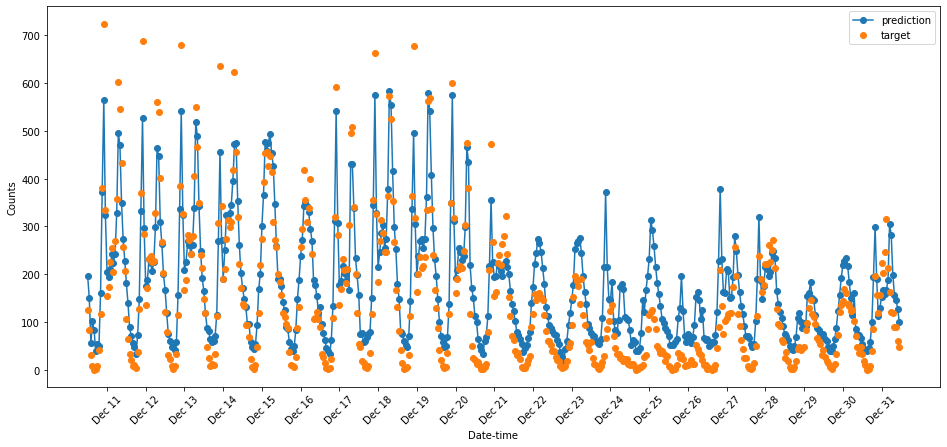

In [96]:
fig, ax = plt.subplots(figsize = (16, 7))


x_data = df_inp[-21*24:].reset_index()['index']

ax.plot(pred_data_test2, 'o-', label='prediction')
ax.plot(tgt_data_test, 'o', label='target')
ax.legend()
ax.set_xlabel('Date-time')
ax.set_ylabel('Counts')

dates = pd.to_datetime(df1.loc[df_inp[-21*24:].index]['dteday'])
dates = dates.apply(lambda d: d.strftime('%b %d'))
ax.set_xticks(np.arange(len(dates))[12::24])
_ = ax.set_xticklabels(dates[12::24], rotation=45)

#### train cycle 3: longer

In [97]:
loss_hist_3 = trn_epoches(10000, md0,loss_fn, train_dataloader,optimizer)


epoch      0/ 10000, loss: 0.091867

epoch    200/ 10000, loss: 0.090632

epoch    400/ 10000, loss: 0.089437

epoch    600/ 10000, loss: 0.088296

epoch    800/ 10000, loss: 0.087225

epoch   1000/ 10000, loss: 0.086222

epoch   1200/ 10000, loss: 0.085277

epoch   1400/ 10000, loss: 0.084385

epoch   1600/ 10000, loss: 0.083550

epoch   1800/ 10000, loss: 0.082778

epoch   2000/ 10000, loss: 0.082078

epoch   2200/ 10000, loss: 0.081445

epoch   2400/ 10000, loss: 0.080877

epoch   2600/ 10000, loss: 0.080368

epoch   2800/ 10000, loss: 0.079910

epoch   3000/ 10000, loss: 0.079499

epoch   3200/ 10000, loss: 0.079130

epoch   3400/ 10000, loss: 0.078800

epoch   3600/ 10000, loss: 0.078505

epoch   3800/ 10000, loss: 0.078243

epoch   4000/ 10000, loss: 0.078013

epoch   4200/ 10000, loss: 0.077812

epoch   4400/ 10000, loss: 0.077641

epoch   4600/ 10000, loss: 0.077496

epoch   4800/ 10000, loss: 0.077378

epoch   5000/ 10000, loss: 0.077283

epoch   5200/ 10000, loss: 0.077208



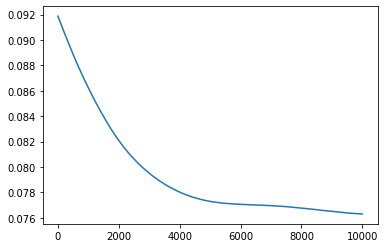

In [99]:
plt.plot(loss_hist_3)

In [100]:
pred_train_3 = test_loop(md0, train_x, train_y, loss_fn)

loss: 0.238708 



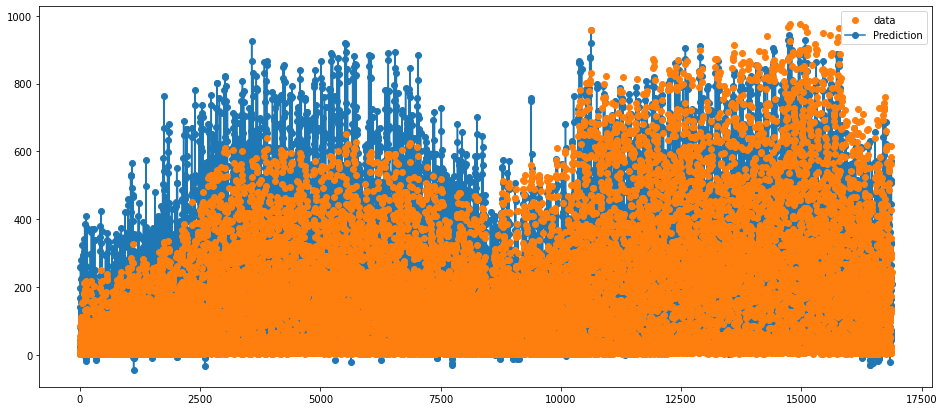

In [360]:
plt.figure(figsize = (16, 7))
pred_data = pred_train_3.numpy() * feature_statistics['cnt'][1] + feature_statistics['cnt'][0]
pred_plot, = plt.plot(pred_data, 'o-')
cnt_plot, = plt.plot(tgt_data_train, 'o')
plt.legend([cnt_plot, pred_plot],['data', 'Prediction'])
plt.show()

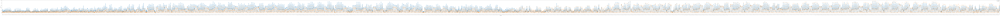

In [363]:
fig, ax = plt.subplots(figsize = (500, 7))

pred_data = pred_train_3.numpy() * feature_statistics['cnt'][1] + feature_statistics['cnt'][0]
ax.plot(pred_data, 'o-', label='prediction')
ax.plot(tgt_data_train, 'o', label='target')
ax.legend()
ax.set_xlabel('Date-time')
ax.set_ylabel('Counts')

dates = pd.to_datetime(df1.loc[df_inp[:-21*24].index]['dteday'])
dates = dates.apply(lambda d: d.strftime('%b %d'))
ax.margins(x=0)
ax.set_xticks(np.arange(len(dates))[12::24])
_ = ax.set_xticklabels(dates[12::24], rotation=45)

plot on train data

In [103]:
pred_test3 = test_loop(md0, test_x, test_y, loss_fn)

loss: 0.113562 



In [105]:
pred_data_test3 = pred_test3.numpy() * feature_statistics['cnt'][1] + feature_statistics['cnt'][0]

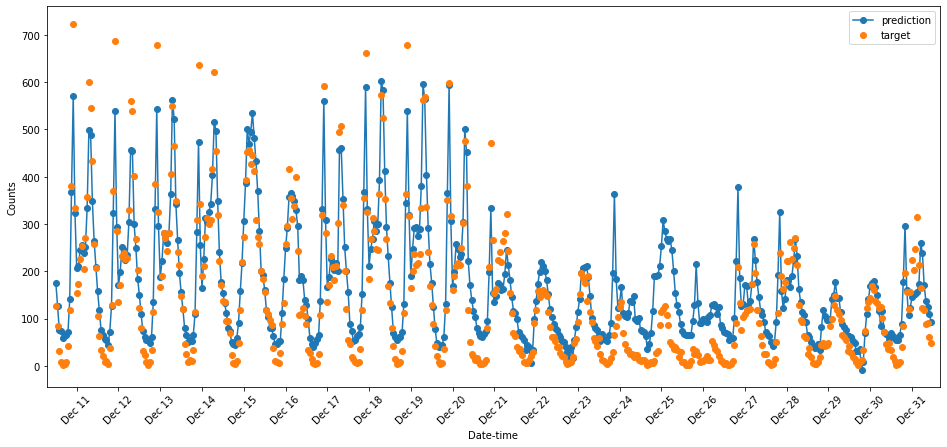

In [116]:
fig, ax = plt.subplots(figsize = (16, 7))
#x_data = df_inp[-21*24:].reset_index()['index']

ax.plot(pred_data_test3, 'o-', label='prediction')
ax.plot(tgt_data_test, 'o', label='target')
ax.legend()
ax.set_xlabel('Date-time')
ax.set_ylabel('Counts')

dates = pd.to_datetime(df1.loc[df_inp[-21*24:].index]['dteday'])
dates = dates.apply(lambda d: d.strftime('%b %d'))
ax.margins(x=0.01)
ax.set_xticks(np.arange(len(dates))[12::24])
_ = ax.set_xticklabels(dates[12::24], rotation=45)

plot on test data

In [125]:
torch.save(md0.state_dict(), 'md0_re_wts.pth')

### Analyze network's performance

In [241]:
md_dict = dict(md0.named_parameters())

In [126]:
md_dict.keys()

dict_keys(['stack.0.weight', 'stack.0.bias', 'stack.2.weight', 'stack.2.bias'])

define hidden layer output extractor

In [157]:
def hidden_out(x, md):
    d = dict(md.named_parameters())
    with torch.no_grad():
        h = torch.sigmoid(x.mm(d['stack.0.weight'].t()) + d['stack.0.bias'])
    return h

In [128]:
bools = [any(tup) for tup in zip(df1['dteday'] == '2012-12-24',
                                 df1['dteday'] == '2012-12-25',
                                 df1['dteday'] == '2012-12-26')]

In [146]:
sub_x = torch.tensor(df_inp.loc[df1[bools].index].values).float()

In [149]:
sub_x.size()

torch.Size([70, 57])

In [164]:
sub_vls = df_tgt.loc[df1[bools].index].values
sub_y = torch.tensor(sub_vls.reshape(len(sub_vls),1)).float()

In [165]:
sub_y.size()

torch.Size([70, 1])

In [158]:
h_results = hidden_out(sub_x, md0).numpy()

In [161]:
h_results.shape

(70, 10)

In [167]:
pred_sub = test_loop(md0,sub_x, sub_y, loss_fn).numpy()

loss: 0.358048 



In [168]:
pred_sub.shape

(70, 1)

In [169]:
pred_sub_org = pred_sub * feature_statistics['cnt'][1] + feature_statistics['cnt'][0]

In [175]:
y_sub_org = df1[bools]['cnt'].values
y_sub_org = y_sub_org.reshape(len(y_sub_org),1)

In [176]:
y_sub_org.shape

(70, 1)

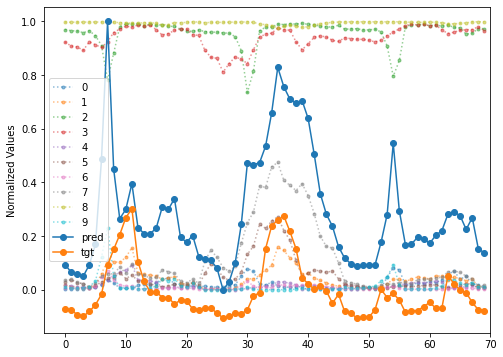

In [220]:
fig, ax = plt.subplots(figsize = (8, 6))
for i in range(10):
    ax.plot(h_results[:,i], '.:', alpha = 0.5, label = i)

ax.plot((pred_sub_org - min(pred_sub_org))/(max(pred_sub_org)-min(pred_sub_org)),'o-',label='pred')
ax.plot((y_sub_org - min(pred_sub_org))/(max(pred_sub_org)-min(pred_sub_org)),'o-',label='tgt')    
ax.set_xlim(right=len(pred_sub_org))
ax.legend()

plt.ylabel('Normalized Values')
plt.show()

In [224]:
md_dict['stack.2.weight'][0,2]

tensor(-2.5741, grad_fn=<SelectBackward0>)

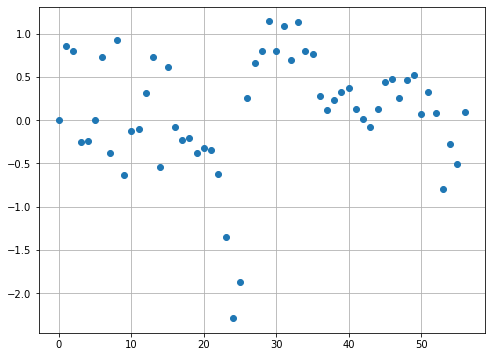

In [239]:
fig, ax = plt.subplots(figsize = (8, 6))
ax.plot(md_dict['stack.0.weight'][2,:].detach().numpy(),'o')
ax.grid(True)

lowest points: #23 24 25

In [233]:
md_dict['stack.0.bias'][2]

tensor(1.3155, grad_fn=<SelectBackward0>)

In [240]:
df_inp.columns[23:26]

Index(['hr_7', 'hr_8', 'hr_9'], dtype='object')

for neuron #2, it's activated at hr_7~hr_9, which lead to the peaks.

In [314]:
md_dict['stack.0.bias']

Parameter containing:
tensor([-1.0920, -1.1361,  1.3155,  1.1482, -2.2525, -1.0242, -1.4723, -0.3465,
         1.5832, -2.9404], requires_grad=True)

### Dicussion

a truely useful predictor should use the data some hours ago to predict the bike usage, rather than use the current data to preduct the current usgae.

In [242]:
df1.columns

Index(['instant', 'dteday', 'season', 'yr', 'mnth', 'hr', 'holiday', 'weekday',
       'workingday', 'weathersit', 'temp', 'atemp', 'hum', 'windspeed',
       'casual', 'registered', 'cnt'],
      dtype='object')

use the current data:
'season', 'mnth', 'hr', 'holiday', 'weekday', 'workingday', 'weathersit'

use the past data: 'temp', 'atemp', 'hum', 'windspeed', 'casual', 'registered', 'cnt'

### Try to train with unnormalized target

#### make unnormalized y data

In [243]:
df_qnt0 = df1[['casual', 'registered', 'cnt']]

In [244]:
df_qnt0

,casual,registered,cnt
0,3,13,16
1,8,32,40
2,5,27,32
3,3,10,13
4,0,1,1
...,...,...,...
17374,11,108,119
17375,8,81,89
17376,7,83,90
17377,13,48,61


In [246]:
df_tgt0 = df_qnt0['cnt']

In [247]:
df_tgt0

0         16
1         40
2         32
3         13
4          1
        ... 
17374    119
17375     89
17376     90
17377     61
17378     49
Name: cnt, Length: 17379, dtype: int64

In [248]:
tsr_tgt0 = torch.tensor(df_tgt0.values.reshape(len(df_tgt),1)).float()

In [249]:
train_y0 = tsr_tgt0[:-21*24,:]
test_y0 = tsr_tgt0[-21*24:,:]

In [250]:
train_y0.size()

torch.Size([16875, 1])

In [251]:
test_y0.size()

torch.Size([504, 1])

In [252]:
train_set_0 = BSDataset(train_x, train_y0)

In [253]:
test_set_0 = BSDataset(test_x, test_y0)

In [254]:
batch_size = 128

In [255]:
train_dataloader_0 = DataLoader(train_set_0, batch_size=batch_size)
test_dataloader_0 = DataLoader(test_set_0, batch_size=batch_size)

#### make model

In [256]:
mdy0_0 = BSModel(inp_size, hidden_size, output_size)

In [257]:
optimizer_0 = optim.SGD(mdy0_0.parameters(), lr=0.01)

#### train & test

In [258]:
loss_hist_y0_0 = trn_epoches(1000, mdy0_0,loss_fn, train_dataloader_0,optimizer_0)

epoch      0/  1000, loss: 14520.823242
epoch    200/  1000, loss: 4517.897949
epoch    400/  1000, loss: 4265.636719
epoch    600/  1000, loss: 4062.678955
epoch    800/  1000, loss: 4116.007812


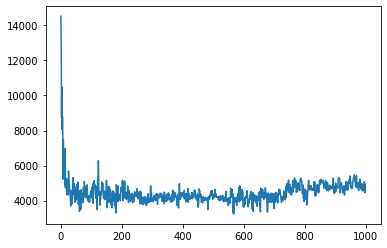

In [259]:
plt.plot(loss_hist_y0_0)

In [260]:
pred_y0_train_0 = test_loop(mdy0_0, train_x, train_y0, loss_fn)

loss: 9231.668945 



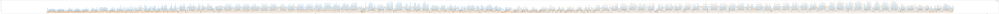

In [261]:
plt.figure(figsize = (500, 7))
pred_data = pred_y0_train_0.numpy()
pred_plot, = plt.plot(pred_data, 'o-')
cnt_plot, = plt.plot(train_y0, 'o')
plt.legend([cnt_plot, pred_plot],['data', 'Prediction'])
plt.show()

In [271]:
tmp = 0
tmr = 20
pred_y0_train_0[tmp*tmr:(tmp+1)*tmr,:]

tensor([[ 46.0578],
        [ 46.0578],
        [ 46.0578],
        [ 46.0578],
        [ 46.0578],
        [ 46.0578],
        [ 46.0578],
        [ 46.0578],
        [ 46.0578],
        [ 46.0578],
        [227.9786],
        [227.9786],
        [369.6851],
        [369.6885],
        [366.1945],
        [193.1671],
        [227.9786],
        [227.9786],
        [227.9786],
        [ 46.0578]])

In [272]:
pred_y0_test_0 = test_loop(mdy0_0, test_x, test_y0, loss_fn)

loss: 6366.573730 



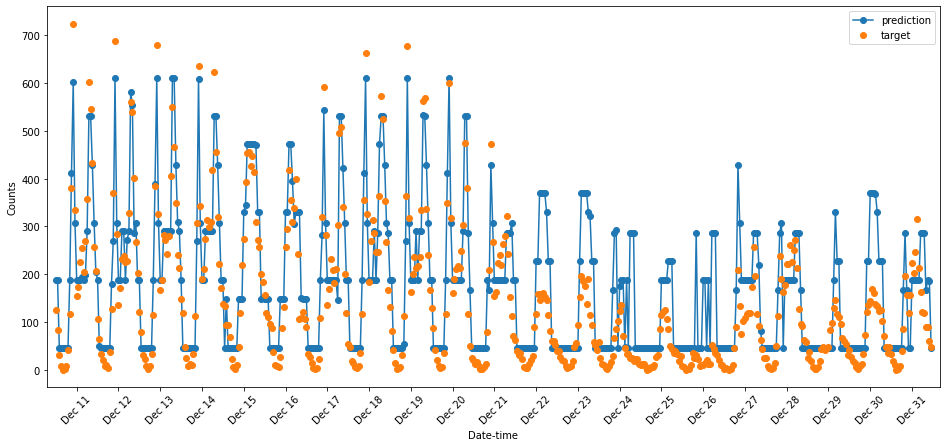

In [273]:
fig, ax = plt.subplots(figsize = (16, 7))

ax.plot(pred_y0_test_0, 'o-', label='prediction')
ax.plot(tgt_data_test, 'o', label='target')
ax.legend()
ax.set_xlabel('Date-time')
ax.set_ylabel('Counts')

dates = pd.to_datetime(df1.loc[df_inp[-21*24:].index]['dteday'])
dates = dates.apply(lambda d: d.strftime('%b %d'))
ax.margins(x=0.01)
ax.set_xticks(np.arange(len(dates))[12::24])
_ = ax.set_xticklabels(dates[12::24], rotation=45)

In [274]:
loss_hist_y0_1 = trn_epoches(1000, mdy0_0,loss_fn, train_dataloader_0,optimizer_0)

epoch      0/  1000, loss: 4511.705566
epoch    200/  1000, loss: 4871.833984
epoch    400/  1000, loss: 4697.482910
epoch    600/  1000, loss: 4733.706543
epoch    800/  1000, loss: 4775.299805


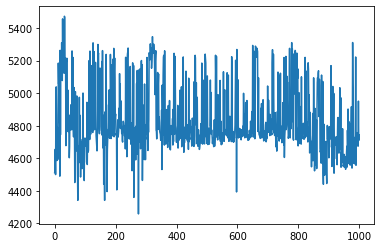

In [275]:
plt.plot(loss_hist_y0_1)

In [277]:
pred_y0_train_1 = test_loop(mdy0_0, train_x, train_y0, loss_fn)

loss: 9230.348633 



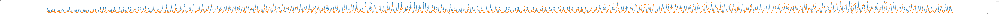

In [278]:
plt.figure(figsize = (500, 7))
pred_data = pred_y0_train_1.numpy()
pred_plot, = plt.plot(pred_data, 'o-')
cnt_plot, = plt.plot(train_y0, 'o')
plt.legend([cnt_plot, pred_plot],['data', 'Prediction'])
plt.show()

In [279]:
pred_y0_test_1 = test_loop(mdy0_0, test_x, test_y0, loss_fn)

loss: 6245.776855 



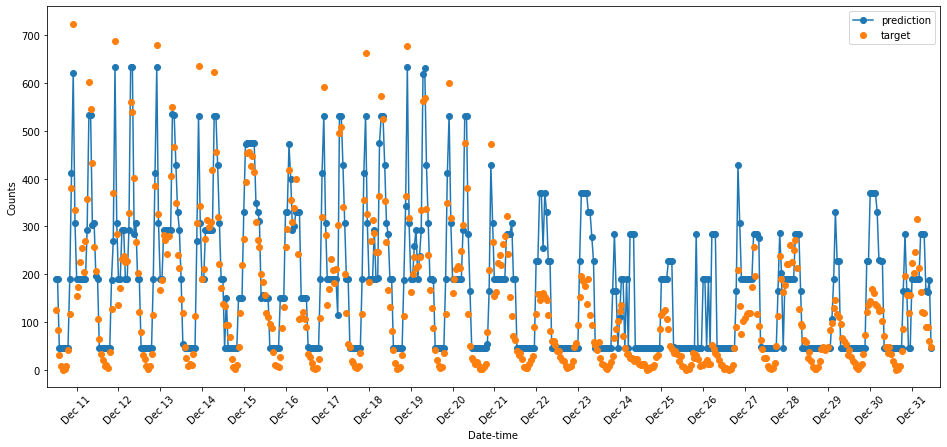

In [280]:
fig, ax = plt.subplots(figsize = (16, 7))

ax.plot(pred_y0_test_1, 'o-', label='prediction')
ax.plot(tgt_data_test, 'o', label='target')
ax.legend()
ax.set_xlabel('Date-time')
ax.set_ylabel('Counts')

dates = pd.to_datetime(df1.loc[df_inp[-21*24:].index]['dteday'])
dates = dates.apply(lambda d: d.strftime('%b %d'))
ax.margins(x=0.01)
ax.set_xticks(np.arange(len(dates))[12::24])
_ = ax.set_xticklabels(dates[12::24], rotation=45)

In [283]:
dict_y00 = dict(mdy0_0.named_parameters())

In [284]:
dict_y00.keys()

dict_keys(['stack.0.weight', 'stack.0.bias', 'stack.2.weight', 'stack.2.bias'])

In [285]:
dict_y00['stack.2.weight']

Parameter containing:
tensor([[142.7647, 238.7746,  73.7048,  91.6450,  68.2360, 180.3937, 103.8330,
          60.7666, 101.4239, 118.9603]], requires_grad=True)

In [298]:
dict_y00['stack.2.bias']

Parameter containing:
tensor([46.3774], requires_grad=True)

In [304]:
np.unique(pred_y0_test_1.flatten().numpy())

array([ 46.37741 ,  46.377415,  46.377453,  46.377502,  46.377506,
        46.37751 ,  46.377655,  46.37837 ,  46.381298,  46.39172 ,
        46.40784 ,  46.43299 ,  46.600513,  46.933994,  47.80509 ,
        48.079967,  48.481598,  54.11628 ,  55.252335, 106.56305 ,
       111.57703 , 115.09475 , 150.2104  , 150.2109  , 150.22368 ,
       151.03204 , 156.68576 , 162.82834 , 165.33775 , 165.3378  ,
       165.99936 , 187.61932 , 188.9041  , 189.004   , 189.1091  ,
       189.14212 , 189.1422  , 189.14227 , 189.14252 , 189.14334 ,
       189.15094 , 189.15231 , 189.18922 , 189.2653  , 189.34138 ,
       190.14452 , 193.0304  , 197.15413 , 202.78183 , 226.74821 ,
       226.7497  , 226.77113 , 226.77116 , 226.77144 , 227.95618 ,
       230.51976 , 237.767   , 255.91177 , 258.49515 , 269.17075 ,
       269.24612 , 275.025   , 277.8958  , 283.25824 , 285.15204 ,
       285.22192 , 286.02307 , 292.91595 , 292.96768 , 292.9719  ,
       292.97382 , 292.97464 , 292.9749  , 292.97507 , 292.975

In [288]:
pred_y0_test_1.size()

torch.Size([504, 1])

In [299]:
pred_y0_test_1.flatten().numpy().sort()

In [300]:
pred_y0_test_1

tensor([[ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],
        [ 46.3774],


In [313]:
dict_y00['stack.0.bias']

Parameter containing:
tensor([ -37.4714,  -52.8333,  -23.6426,  -29.9051,  -25.3970,  -83.2846,
          -6.9793,  -19.1857,  -74.7415, -109.6713], requires_grad=True)

### make model 1 & re-train

In [305]:
mdy0_1 = BSModel(inp_size, hidden_size, output_size)

In [306]:
optimizer_1 = optim.SGD(mdy0_1.parameters(), lr=0.01)

#### train & test

In [307]:
loss_hist_m1y0_0 = trn_epoches(1000, mdy0_1,loss_fn, train_dataloader_0,optimizer_1)

epoch      0/  1000, loss: 11242.893555
epoch    200/  1000, loss: 4181.407715
epoch    400/  1000, loss: 4711.713867
epoch    600/  1000, loss: 4831.187500
epoch    800/  1000, loss: 4560.086914


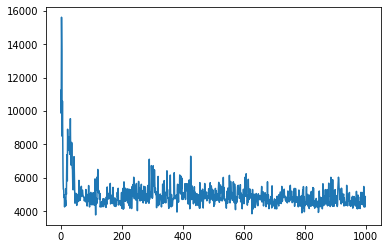

In [308]:
plt.plot(loss_hist_m1y0_0)

In [309]:
pred_m1y0_train_0 = test_loop(mdy0_1, train_x, train_y0, loss_fn)

loss: 9669.030273 



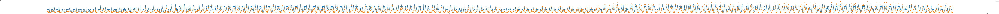

In [310]:
plt.figure(figsize = (500, 7))
pred_data = pred_m1y0_train_0.numpy()
pred_plot, = plt.plot(pred_data, 'o-')
cnt_plot, = plt.plot(train_y0, 'o')
plt.legend([cnt_plot, pred_plot],['data', 'Prediction'])
plt.show()

In [311]:
pred_m1y0_test_0 = test_loop(mdy0_1, test_x, test_y0, loss_fn)

loss: 6948.685059 



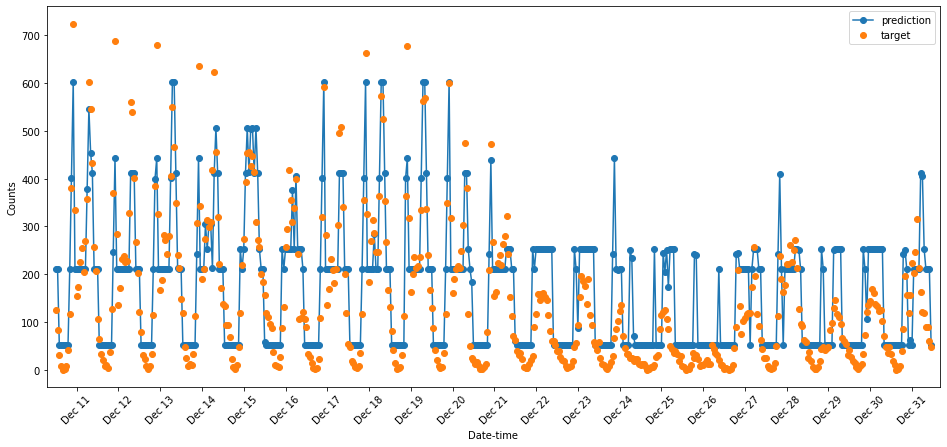

In [312]:
fig, ax = plt.subplots(figsize = (16, 7))

ax.plot(pred_m1y0_test_0, 'o-', label='prediction')
ax.plot(tgt_data_test, 'o', label='target')
ax.legend()
ax.set_xlabel('Date-time')
ax.set_ylabel('Counts')

dates = pd.to_datetime(df1.loc[df_inp[-21*24:].index]['dteday'])
dates = dates.apply(lambda d: d.strftime('%b %d'))
ax.margins(x=0.01)
ax.set_xticks(np.arange(len(dates))[12::24])
_ = ax.set_xticklabels(dates[12::24], rotation=45)

In [315]:
dict_y01 = dict(mdy0_1.named_parameters())

In [316]:
dict_y01.keys()

dict_keys(['stack.0.weight', 'stack.0.bias', 'stack.2.weight', 'stack.2.bias'])

In [317]:
dict_y01['stack.0.bias']

Parameter containing:
tensor([ -38.4627, -160.7807,  -20.4367,  -19.5354,  -17.9153,  -44.2041,
         -53.4498,   -9.7021,  -81.1548,  -26.2099], requires_grad=True)

In [318]:
h_rslt_1 = hidden_out(test_x,mdy0_1)

In [321]:
h_rslt_1.size()

torch.Size([504, 10])

In [324]:
predar_m1y0_test= pred_m1y0_test_0.numpy()

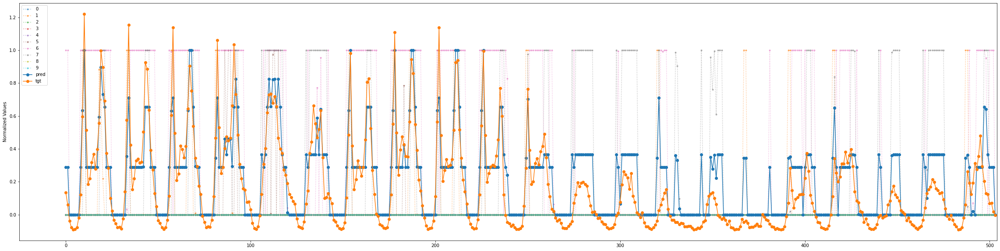

In [326]:
fig, ax = plt.subplots(figsize = (40, 10))
for i in range(10):
    ax.plot(h_rslt_1[:,i], '.:', alpha = 0.5, label = i)

ax.plot((predar_m1y0_test - min(predar_m1y0_test))/(max(predar_m1y0_test)-min(predar_m1y0_test)),'o-',label='pred')
ax.plot((tgt_data_test - min(predar_m1y0_test))/(max(predar_m1y0_test)-min(predar_m1y0_test)),'o-',label='tgt')    
ax.set_xlim(right=len(predar_m1y0_test))
ax.legend()

plt.ylabel('Normalized Values')
plt.show()

Text(0, 0.5, 'tgt')

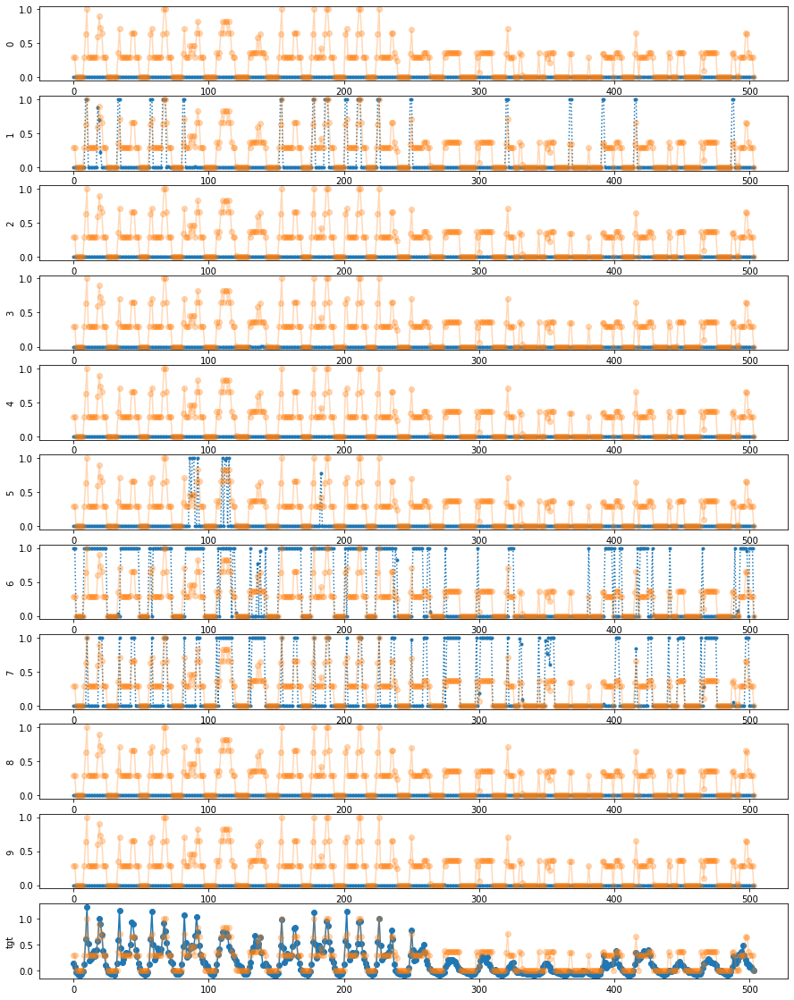

In [348]:
fig, ax = plt.subplots(11, figsize = (15, 20))
for i in range(10):
    ax[i].plot(h_rslt_1[:,i], '.:', label = i)
    ax[i].plot((predar_m1y0_test - min(predar_m1y0_test))/(max(predar_m1y0_test)-min(predar_m1y0_test)),
               'o-',
               label='pred',
               alpha=0.3)
    ax[i].set_ylabel(i)


ax[10].plot((tgt_data_test - min(predar_m1y0_test))/(max(predar_m1y0_test)-min(predar_m1y0_test)),'o-',label='tgt')    
ax[10].plot((predar_m1y0_test - min(predar_m1y0_test))/(max(predar_m1y0_test)-min(predar_m1y0_test)),
            'o-',
            label='pred',
            alpha=0.3)
ax[10].set_ylabel('tgt')
#ax.set_xlim(right=len(predar_m1y0_test))
#ax.legend()

#plt.ylabel('Normalized Values')
#plt.show()

only 1,5,6,7 are active

In [345]:
dict_y01['stack.0.bias']

Parameter containing:
tensor([ -38.4627, -160.7807,  -20.4367,  -19.5354,  -17.9153,  -44.2041,
         -53.4498,   -9.7021,  -81.1548,  -26.2099], requires_grad=True)

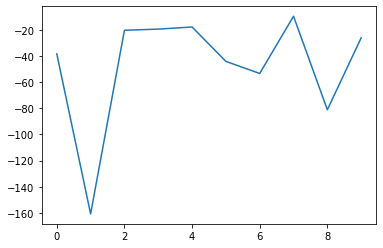

In [344]:
plt.plot(dict_y01['stack.0.bias'].detach().numpy())

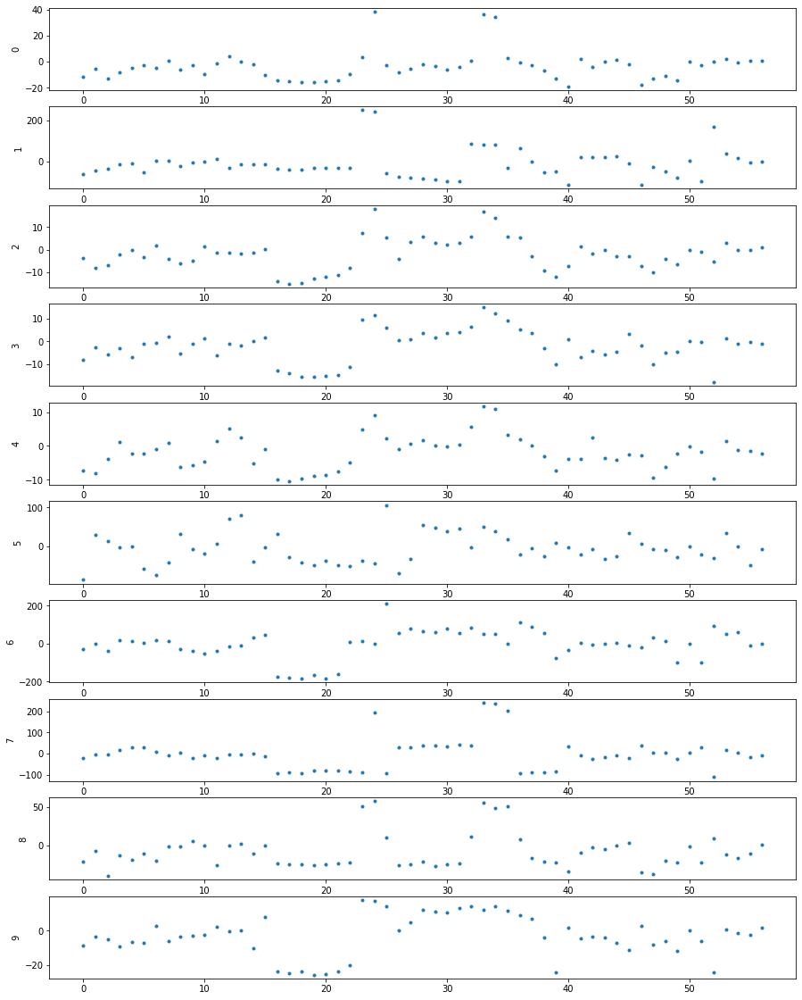

In [350]:
w = dict_y01['stack.0.weight'].detach().numpy()
fig, ax = plt.subplots(10, figsize = (15, 20))
for i in range(10):
    ax[i].plot(w[i,:], '.', label = i)
    ax[i].set_ylabel(i)

1,5,6,7 has stronger input weight to overcome the strong minus bias

try train more loops

In [351]:
loss_hist_m1y0_1 = trn_epoches(10000, mdy0_1,loss_fn, train_dataloader_0,optimizer_1)

epoch      0/ 10000, loss: 4119.841309
epoch    200/ 10000, loss: 4515.719727
epoch    400/ 10000, loss: 4340.305664
epoch    600/ 10000, loss: 4170.955078
epoch    800/ 10000, loss: 4328.859863
epoch   1000/ 10000, loss: 4124.179199
epoch   1200/ 10000, loss: 4188.551758
epoch   1400/ 10000, loss: 4003.505615
epoch   1600/ 10000, loss: 4401.179688
epoch   1800/ 10000, loss: 4151.099121
epoch   2000/ 10000, loss: 4119.988770
epoch   2200/ 10000, loss: 4593.236816
epoch   2400/ 10000, loss: 4355.627930
epoch   2600/ 10000, loss: 4145.941406
epoch   2800/ 10000, loss: 4481.080078
epoch   3000/ 10000, loss: 4158.133789
epoch   3200/ 10000, loss: 4244.146484
epoch   3400/ 10000, loss: 4365.540527
epoch   3600/ 10000, loss: 4072.169434
epoch   3800/ 10000, loss: 4116.150879
epoch   4000/ 10000, loss: 4712.176270
epoch   4200/ 10000, loss: 4255.868164
epoch   4400/ 10000, loss: 4329.880371
epoch   4600/ 10000, loss: 4193.520508
epoch   4800/ 10000, loss: 4292.201172
epoch   5000/ 10000, loss

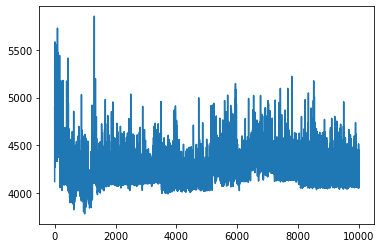

In [352]:
plt.plot(loss_hist_m1y0_1)

In [353]:
pred_m1y0_train_1 = test_loop(mdy0_1, train_x, train_y0, loss_fn)

loss: 8047.451172 



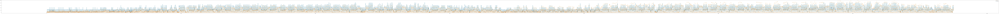

In [354]:
plt.figure(figsize = (500, 7))
pred_data = pred_m1y0_train_1.numpy()
pred_plot, = plt.plot(pred_data, 'o-')
cnt_plot, = plt.plot(train_y0, 'o')
plt.legend([cnt_plot, pred_plot],['data', 'Prediction'])
plt.show()

In [355]:
pred_m1y0_test_1 = test_loop(mdy0_1, test_x, test_y0, loss_fn)

loss: 6473.885742 



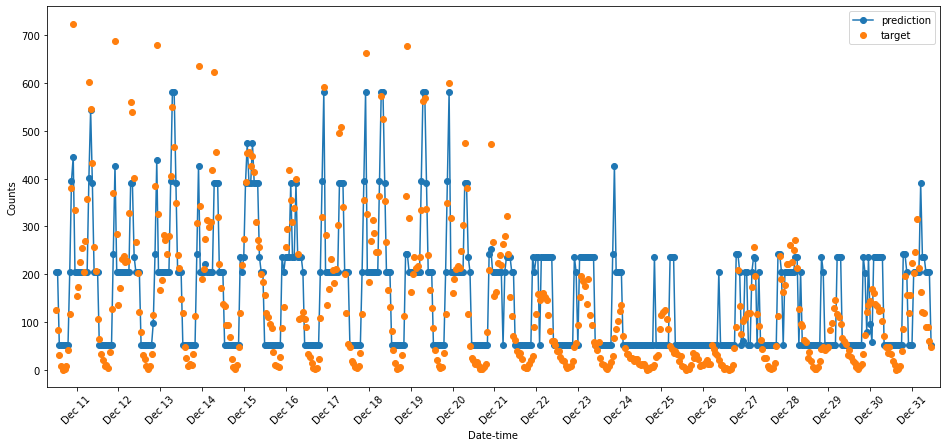

In [356]:
fig, ax = plt.subplots(figsize = (16, 7))

ax.plot(pred_m1y0_test_1, 'o-', label='prediction')
ax.plot(tgt_data_test, 'o', label='target')
ax.legend()
ax.set_xlabel('Date-time')
ax.set_ylabel('Counts')

dates = pd.to_datetime(df1.loc[df_inp[-21*24:].index]['dteday'])
dates = dates.apply(lambda d: d.strftime('%b %d'))
ax.margins(x=0.01)
ax.set_xticks(np.arange(len(dates))[12::24])
_ = ax.set_xticklabels(dates[12::24], rotation=45)

In [358]:
torch.save(mdy0_1.state_dict(), 'md/mdy0_1_wts.pth')

#### Retrain with higher learning rate

In [364]:
optimizer_2 = optim.SGD(mdy0_1.parameters(), lr=0.2)

In [365]:
loss_hist_m1y0_2 = trn_epoches(1000, mdy0_1,loss_fn, train_dataloader_0,optimizer_2)

epoch      0/  1000, loss: 5701.964355
epoch    200/  1000, loss: 4724.001953
epoch    400/  1000, loss: 5272.359863
epoch    600/  1000, loss: 4624.531738
epoch    800/  1000, loss: 5036.009766


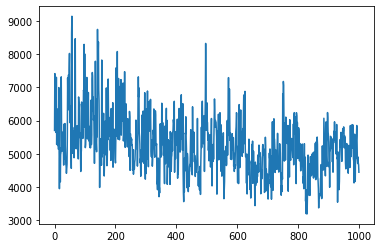

In [366]:
plt.plot(loss_hist_m1y0_2)

In [367]:
optimizer_3 = optim.SGD(mdy0_1.parameters(), lr=0.6)

In [368]:
loss_hist_m1y0_3 = trn_epoches(1000, mdy0_1,loss_fn, train_dataloader_0,optimizer_3)

epoch      0/  1000, loss: 7568.048340
epoch    200/  1000, loss: 9188.696289
epoch    400/  1000, loss: 7634.847656
epoch    600/  1000, loss: 6416.912598
epoch    800/  1000, loss: 6102.571289


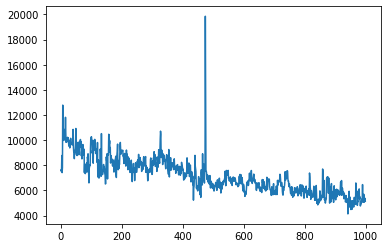

In [369]:
plt.plot(loss_hist_m1y0_3)

In [370]:
loss_hist_m1y0_4 = trn_epoches(3000, mdy0_1,loss_fn, train_dataloader_0,optimizer_3)

epoch      0/  3000, loss: 6067.707520
epoch    200/  3000, loss: 4358.812988
epoch    400/  3000, loss: 4563.148438
epoch    600/  3000, loss: 4775.462402
epoch    800/  3000, loss: 5363.091797
epoch   1000/  3000, loss: 4424.119629
epoch   1200/  3000, loss: 4888.863770
epoch   1400/  3000, loss: 4850.922363
epoch   1600/  3000, loss: 5008.513672
epoch   1800/  3000, loss: 4597.598145
epoch   2000/  3000, loss: 4148.822266
epoch   2200/  3000, loss: 4338.083496
epoch   2400/  3000, loss: 5024.492188
epoch   2600/  3000, loss: 5380.725098
epoch   2800/  3000, loss: 5314.462402


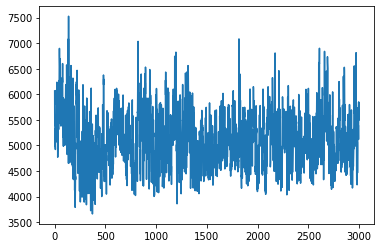

In [371]:
plt.plot(loss_hist_m1y0_4)

In [372]:
optimizer_4 = optim.SGD(mdy0_1.parameters(), lr=0.9)

In [373]:
loss_hist_m1y0_4 = trn_epoches(1000, mdy0_1,loss_fn, train_dataloader_0,optimizer_4)

epoch      0/  1000, loss:     nan
epoch    200/  1000, loss:     nan


KeyboardInterrupt: 

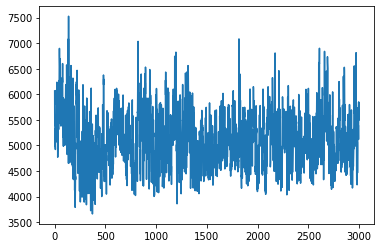

In [374]:
plt.plot(loss_hist_m1y0_4)

### Try use RelU

In [378]:
class BSReLUModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(BSReLUModel, self).__init__()
        self.stack = nn.Sequential(
            nn.Linear(input_size, hidden_size),
            nn.ReLU(),
            nn.Linear(hidden_size, output_size)
        )
    def forward(self, inp):
        return self.stack(inp)

Because RelU is less non-linear than sigmoid, I use more hidden neurons here.

In [379]:
hidden_size_relu = 20

In [380]:
md_relu_0 = BSReLUModel(inp_size, hidden_size_relu, output_size)

In [381]:
optimizer_r_0 = optim.SGD(md_relu_0.parameters(), lr=0.01)

#### Train & test on dataset of normalized targets

In [382]:
loss_hist_relu_0 = trn_epoches(1000, md_relu_0,loss_fn, train_dataloader,optimizer_r_0)

epoch      0/  1000, loss: 0.760634
epoch    200/  1000, loss: 0.077181
epoch    400/  1000, loss: 0.078826
epoch    600/  1000, loss: 0.076021
epoch    800/  1000, loss: 0.071853


In [386]:
pred_relu_train_0 = test_loop(md_relu_0, train_x, train_y, loss_fn)

loss: 0.278742 



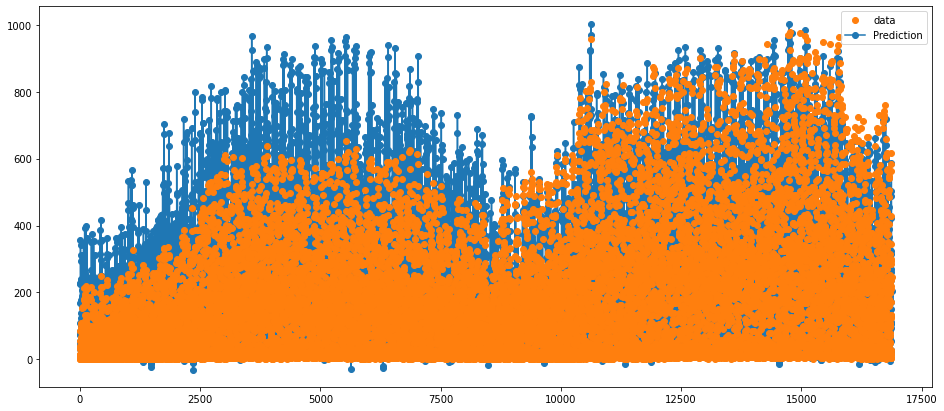

In [387]:
plt.figure(figsize = (16, 7))
pred_data = pred_relu_train_0.numpy() * feature_statistics['cnt'][1] + feature_statistics['cnt'][0]
pred_plot, = plt.plot(pred_data, 'o-')
cnt_plot, = plt.plot(tgt_data_train, 'o')
plt.legend([cnt_plot, pred_plot],['data', 'Prediction'])
plt.show()

In [388]:
pred_relu_test_0 = test_loop(md_relu_0, test_x, test_y, loss_fn)

loss: 0.120043 



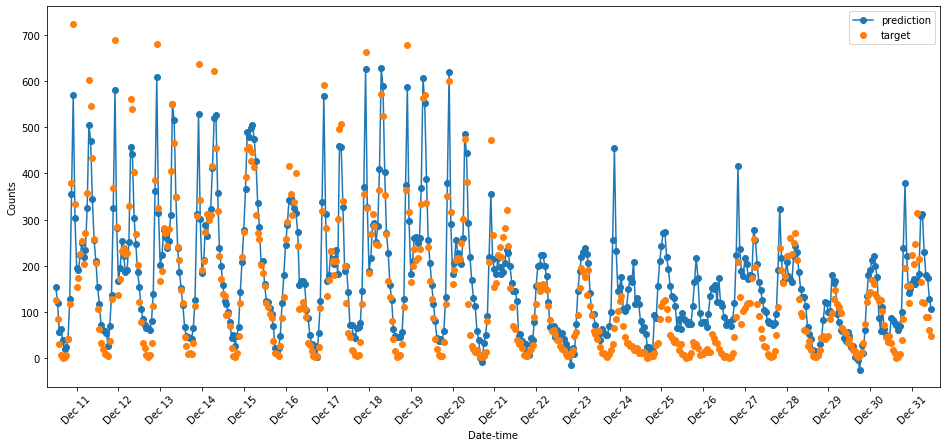

In [389]:
pred_data_test3 = pred_relu_test_0.numpy() * feature_statistics['cnt'][1] + feature_statistics['cnt'][0]

fig, ax = plt.subplots(figsize = (16, 7))
#x_data = df_inp[-21*24:].reset_index()['index']

ax.plot(pred_data_test3, 'o-', label='prediction')
ax.plot(tgt_data_test, 'o', label='target')
ax.legend()
ax.set_xlabel('Date-time')
ax.set_ylabel('Counts')

dates = pd.to_datetime(df1.loc[df_inp[-21*24:].index]['dteday'])
dates = dates.apply(lambda d: d.strftime('%b %d'))
ax.margins(x=0.01)
ax.set_xticks(np.arange(len(dates))[12::24])
_ = ax.set_xticklabels(dates[12::24], rotation=45)

test relu ok, then try relu on unnormalized target data.

#### Train & test on dataset of "un"normalized targets

In [403]:
md_relu_y0_0 = BSReLUModel(inp_size, hidden_size_relu, output_size)

In [404]:
optimizer_r_y0_0 = optim.SGD(md_relu_y0_0.parameters(), lr=0.001)

In [405]:
loss_hist_relu_y0_0 = trn_epoches(1000, md_relu_y0_0,loss_fn, train_dataloader_0, optimizer_r_y0_0)

epoch      0/  1000, loss: 32156.462891
epoch    200/  1000, loss: 2019.776123
epoch    400/  1000, loss: 1940.293701
epoch    600/  1000, loss: 1893.388550
epoch    800/  1000, loss: 1778.167236


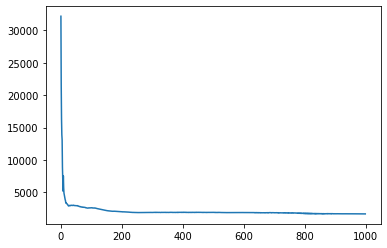

In [406]:
plt.plot(loss_hist_relu_y0_0)

In [407]:
pred_reluy0_train_0 = test_loop(md_relu_y0_0, train_x, train_y0, loss_fn)

loss: 9198.029297 



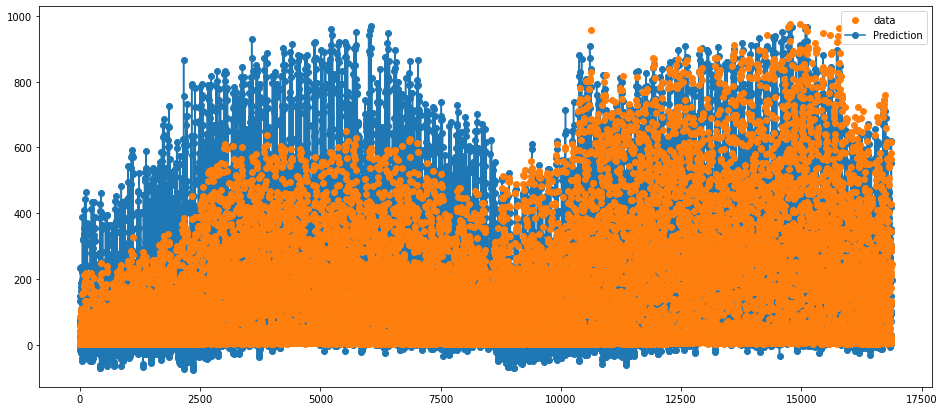

In [408]:
plt.figure(figsize = (16, 7))
pred_data = pred_reluy0_train_0.numpy()
pred_plot, = plt.plot(pred_data, 'o-')
cnt_plot, = plt.plot(train_y0, 'o')
plt.legend([cnt_plot, pred_plot],['data', 'Prediction'])
plt.show()

In [409]:
pred_reluy0_train_0 = test_loop(md_relu_y0_0, test_x, test_y0, loss_fn)

loss: 5508.974121 



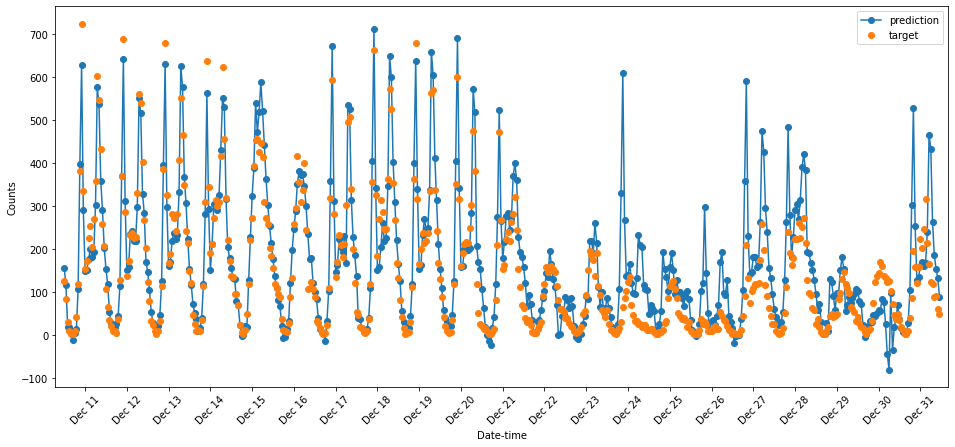

In [410]:
fig, ax = plt.subplots(figsize = (16, 7))

ax.plot(pred_reluy0_train_0, 'o-', label='prediction')
ax.plot(tgt_data_test, 'o', label='target')
ax.legend()
ax.set_xlabel('Date-time')
ax.set_ylabel('Counts')

dates = pd.to_datetime(df1.loc[df_inp[-21*24:].index]['dteday'])
dates = dates.apply(lambda d: d.strftime('%b %d'))
ax.margins(x=0.01)
ax.set_xticks(np.arange(len(dates))[12::24])
_ = ax.set_xticklabels(dates[12::24], rotation=45)

The discreteness problem is now fixed, So the cause should be sigmoid's gradient vanishing.